In [1]:
import warnings
warnings.filterwarnings('ignore')


import anndata as ad
import squidpy as sq
import scanpy as sc

import numpy as np
import pandas as pd
import os

from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from cycler import cycler

In [2]:
# --------------------------------------------------------------------------------
# Edit this path
# --------------------------------------------------------------------------------
FILEPATHBASE = '/Users/mmd47/Library/CloudStorage/GoogleDrive-mmd47@yale.edu/My Drive/DiStasio Lab/DiStasio Lab Share/'
#FILEPATHBASE = '/home/mdistasio/YaleGoogleDrive/DiStasio Lab/DiStasio Lab Share/'


# --------------------------------------------------------------------------------
SAVEFIGS = True
if SAVEFIGS:
    IMGDIR = os.path.join(FILEPATHBASE,'02 Analysis', 'annData_ManualAnnotate', 'img', 'tmp')



In [3]:
# --------------------------------------------------------------------------------
# Load integrated datasets (generated by IntegrateHarmony.py)
# --------------------------------------------------------------------------------
filename = os.path.join(FILEPATHBASE,'02 Analysis', 'annData_ManualAnnotate', 'calc', 'retinas_all_integrated_harmony.h5ad')
print("Loading Data from: " + filename)
retinas_all = ad.read_h5ad(filename)

Loading Data from: /Users/mmd47/Library/CloudStorage/GoogleDrive-mmd47@yale.edu/My Drive/DiStasio Lab/DiStasio Lab Share/02 Analysis/annData_ManualAnnotate/calc/retinas_all_integrated_harmony.h5ad


In [31]:
SampleKey = retinas_all.uns["SampleKey"]
Samples = list(retinas_all.obs['dataset'].cat.categories)

nGroupsToPlot = 10
groups = sorted(np.unique(retinas_all.obs['leiden']), key=lambda x: int(x))[0:nGroupsToPlot]

spect = plt.cm.Paired.resampled(nGroupsToPlot)
newcolors = np.flip(spect(np.linspace(0,1,nGroupsToPlot)), axis=0)
newpalette = ListedColormap(newcolors)
color_cycler = cycler(color=newpalette.colors)

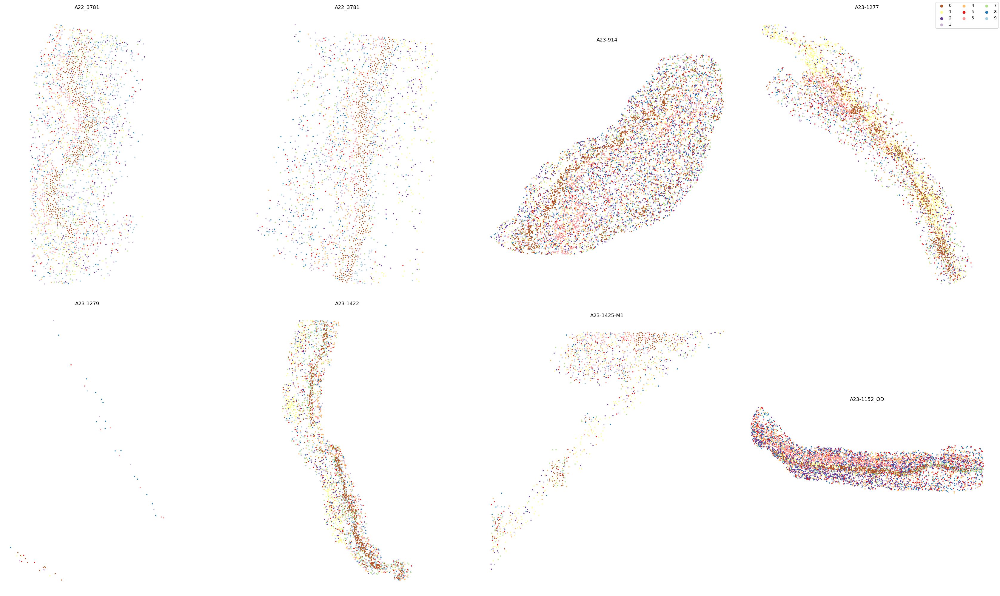

In [28]:
nRow = 2
nCol = int(np.ceil(len(Samples)/2))
fig, axs = plt.subplots(nRow, nCol, figsize=(35,20))
for r in np.arange(len(Samples)):
    ax = axs.reshape(-1)[r]
    ss = 10
    sq.pl.spatial_scatter(retinas_all[retinas_all.obs['dataset']==Samples[r]],
                          color='leiden',
                          groups=groups,
                          size=ss,
                          shape=None,
                          ax=ax,
                          palette=newpalette)
    ax.set_title(SampleKey[Samples[r]])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.get_legend().remove()
fig.tight_layout()

labels_handles = {  label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())    }
fig.legend( labels_handles.values(), labels_handles.keys(), loc = "upper right", ncol=3)

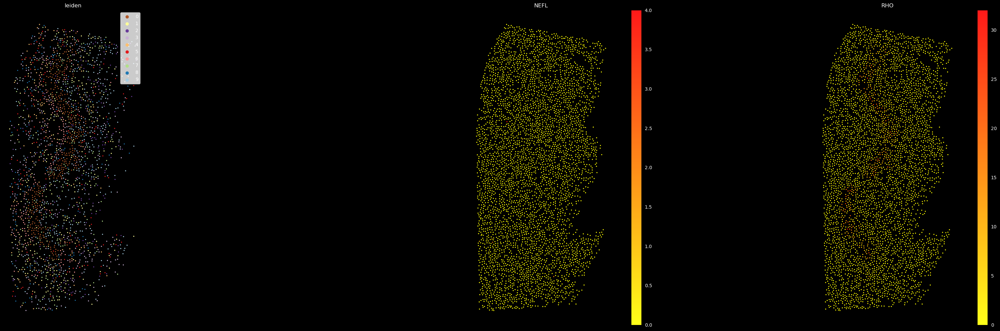

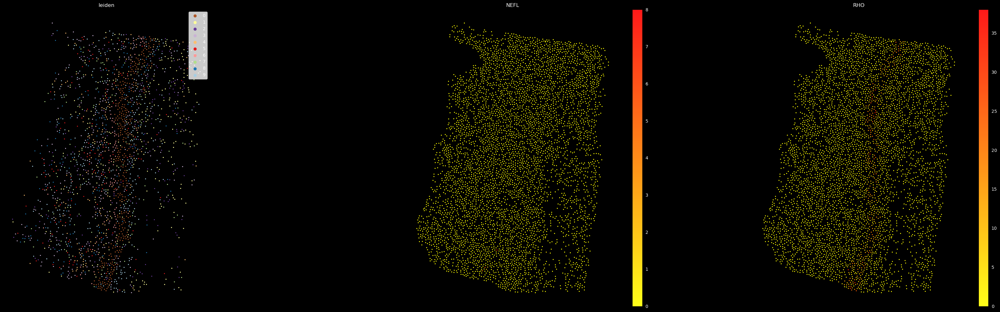

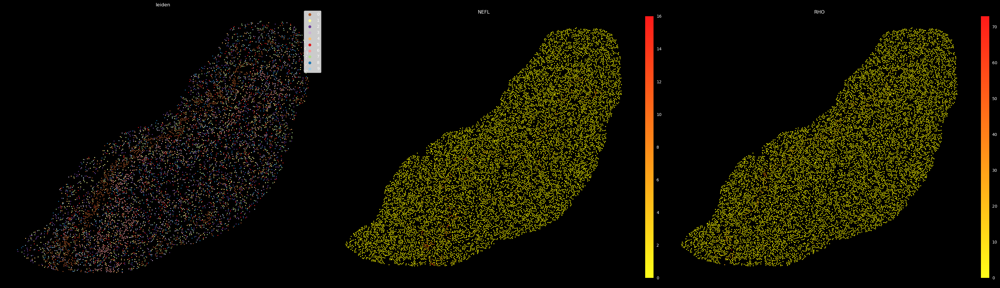

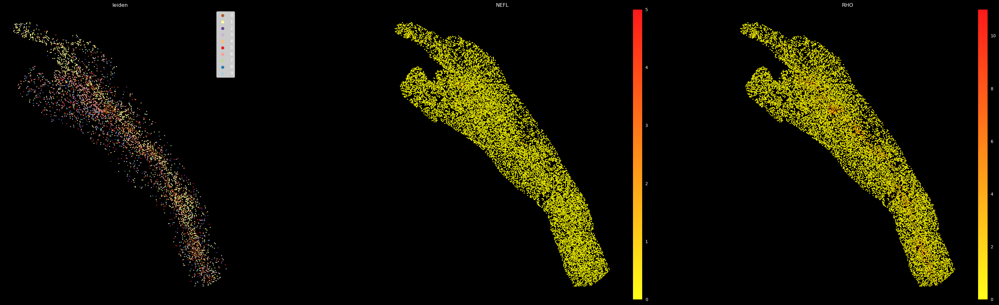

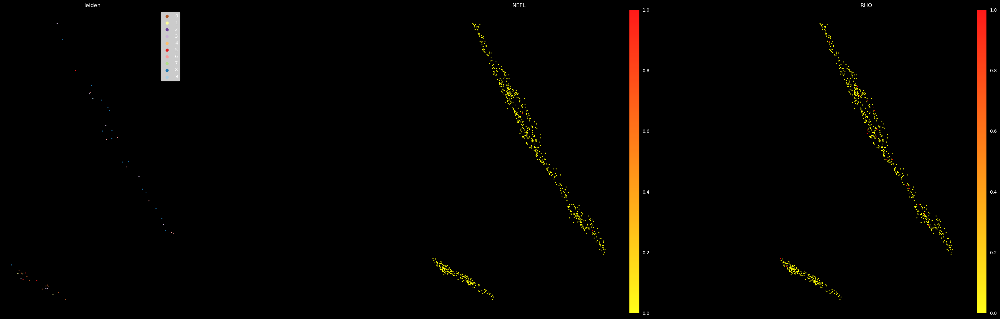

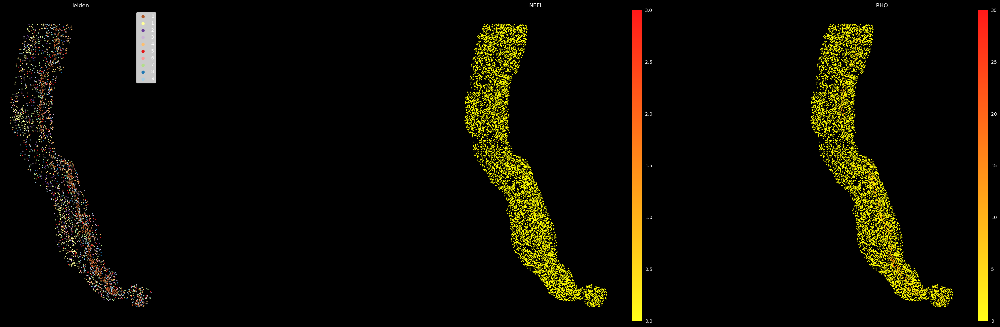

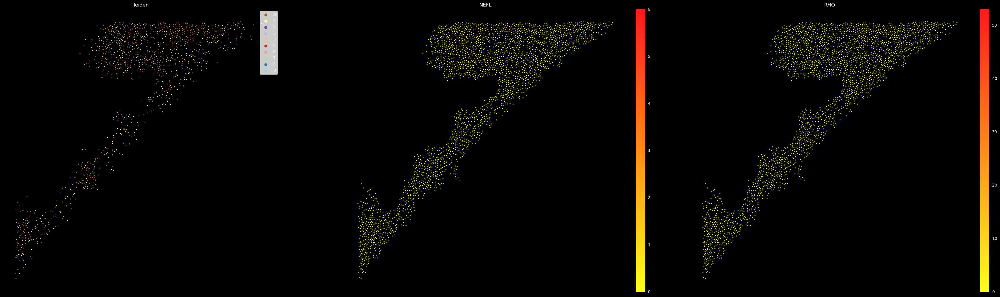

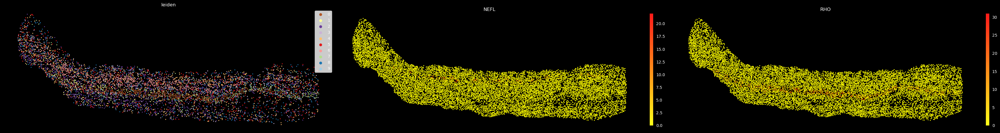

In [89]:
ss = 5

GenesToShow = ['NEFL', 'RHO']

for r in np.arange(len(Samples)):
    fig, axs = plt.subplots(1, 3, figsize=(35,10))
    sq.pl.spatial_scatter(retinas_all[retinas_all.obs['dataset']==Samples[r]],
                                  color=['leiden'] + GenesToShow,
                                  groups=groups,
                                  na_color=(0,0,0,0),
                                  size=ss,
                                  shape=None,
                                  fig = fig,
                                  ax = axs,
                                  alpha=0.9,
                                  cmap='autumn_r',
                                  legend_na=True,
                                  palette=newpalette)
    for ax in axs:
    # ax.set_title(SampleKey[Samples[r]])
        ax.set_facecolor('k')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        
        
    fig.tight_layout()
    fig.set_facecolor('k')
    for text in fig.findobj(match=lambda x: isinstance(x, plt.Text)):
        if hasattr(text, 'set_color'):
            text.set_color('white')
    
    axs[0].legend( labels_handles.values(), labels_handles.keys(), loc = "upper right", ncol=1)
    
    ax_position = ax.get_position()
    for c in fig.get_children()[-len(GenesToShow):]:
        c_position = c.get_position()
        c.set_position([c_position.x1 -0.02, ax_position.y0, 0.01, ax_position.height])

In [135]:
import re
f = os.path.join(FILEPATHBASE, '03 Data', 'AMD_GWAS_Associations', 'gwas-association-downloaded_2023-12-08-EFO_1001492-withChildTraits.tsv')
raw_in = pd.read_csv(f, delimiter='\t')

GWAS_Assoc_AMD_ = pd.Series([ss.strip() for ss in sum([re.split(', | -',str(s)) for s in raw_in['MAPPED_GENE']],[])]).unique()

In [162]:

GWAS_Assoc_AMD = retinas_all.var.index.intersection(GWAS_Assoc_AMD_)
GWAS_Assoc_AMD

Index(['ABHD2', 'ADCY5', 'ATF7IP2', 'B3GLCT', 'BARD1', 'BRAP', 'CCHCR1', 'CFH',
       'CFI', 'CLMP', 'DAPK3', 'DPF3', 'ERICH1', 'FGD6', 'GLI3', 'HIVEP2',
       'HOMEZ', 'IFNAR2', 'KCNJ3', 'KCNMA1', 'LYAR', 'MARK4', 'MCUB',
       'MIR29B2CHG', 'MMP9', 'NECTIN2', 'OAS1', 'PDCL3P4', 'PLA2G12A',
       'RAB30-DT', 'RDH5', 'SCPEP1', 'SLC16A8', 'SLC29A3', 'SPOCK2', 'TACC2',
       'TMEM268', 'TMEM97', 'TNR', 'TOMM40', 'TRPM3', 'TYK2', 'U3', 'WAC-AS1',
       'ZFP1'],
      dtype='object')

In [151]:
retinas_all.obs['GWAS_AMD_score'] = retinas_all[:,GWAS_Assoc_AMD.tolist()].X.mean(axis=1)

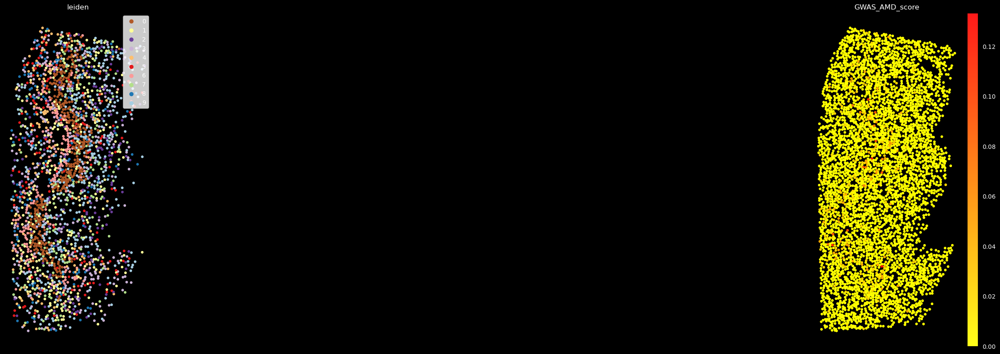

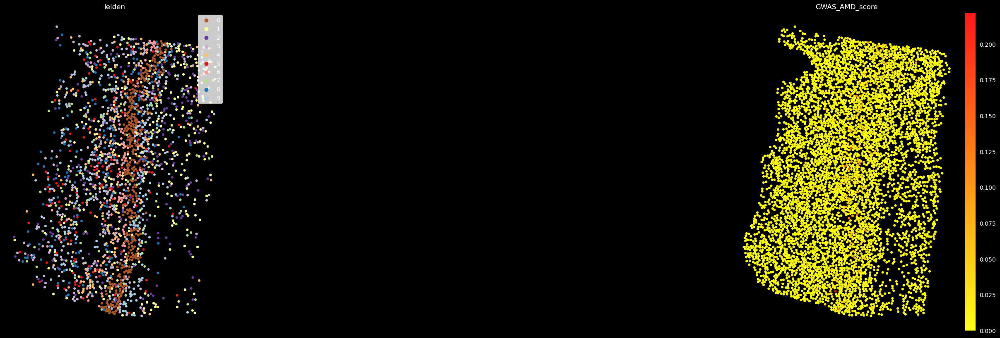

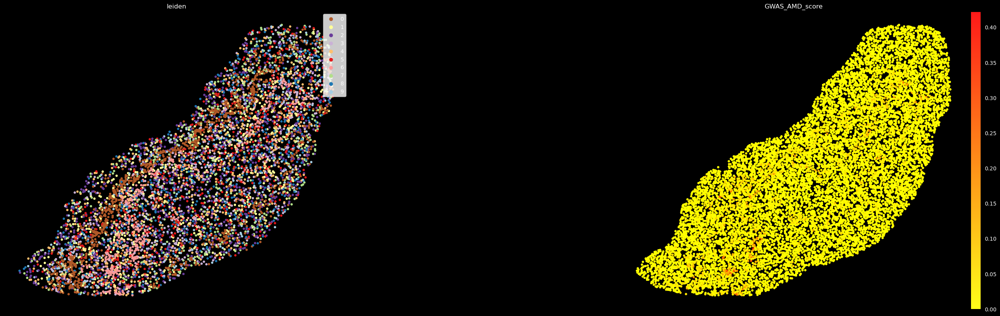

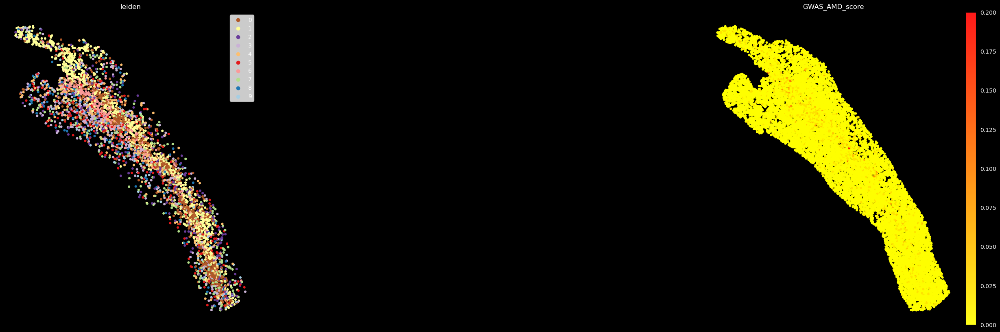

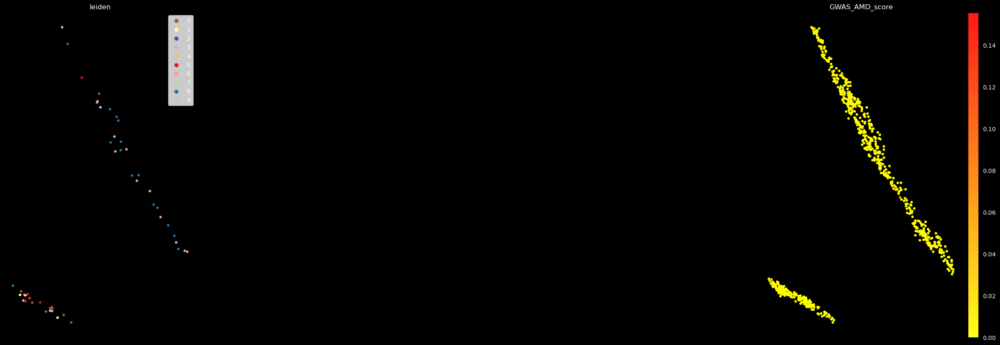

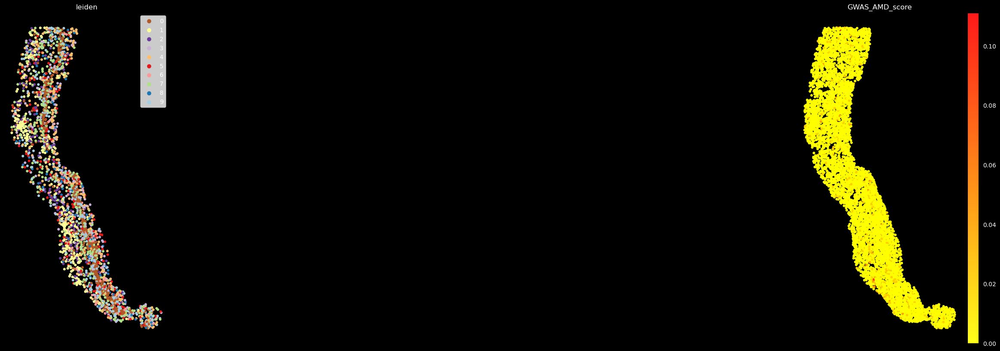

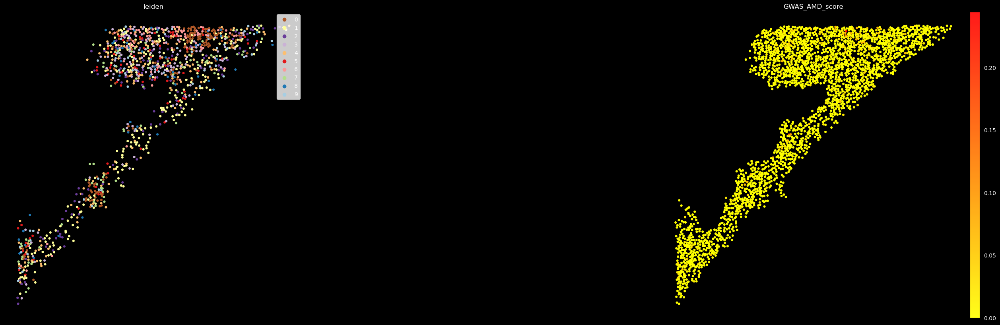

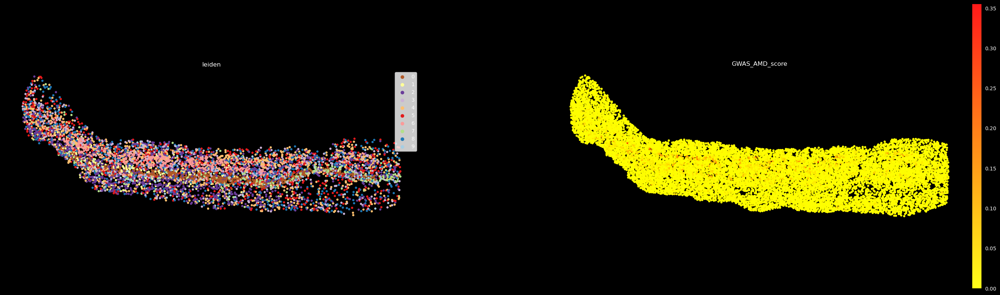

In [161]:

ss = 40
for r in np.arange(len(Samples)):
    fig, axs = plt.subplots(1, 2, figsize=(35,10))
    sq.pl.spatial_scatter(retinas_all[retinas_all.obs['dataset']==Samples[r]],
                                  color=['leiden', 'GWAS_AMD_score'],
                                  groups=groups,
                                  na_color=(0,0,0,0),
                                  size=ss,
                                  shape=None,
                                  fig = fig,
                                  ax = axs,
                                  alpha=0.9,
                                  cmap='autumn_r',
                                  legend_na=True,
                                  palette=newpalette)
    for ax in axs:
    # ax.set_title(SampleKey[Samples[r]])
        ax.set_facecolor('k')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        
        
    #fig.tight_layout()
    fig.set_facecolor('k')
    for text in fig.findobj(match=lambda x: isinstance(x, plt.Text)):
        if hasattr(text, 'set_color'):
            text.set_color('white')
    
    axs[0].legend( labels_handles.values(), labels_handles.keys(), loc = "upper right", ncol=1)
    
#    ax_position = ax.get_position()
#    for c in fig.get_children()[-len(GenesToShow):]:
#        c_position = c.get_position()
#        c.set_position([c_position.x1 -0.02, ax_position.y0, 0.01, ax_position.height])


(2340.0435729847495, 310.0317982203371, 1041.9103485838777, 388.43640355932575)